# ExPo Venus polarization data analysis

### This notebook performs some analysis on the Venus polarized flux data obtained by Rodenhuis et al. 2011 during their ExPo test run. 

In [245]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Sun Apr  5 23:00:50 2020

@author: gouravmahapatr, TU Delft
"""
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import mpld3
mpld3.enable_notebook()

In [246]:
#%%
# set the path to the file containing the dataset
path1 = '/Users/gouravmahapatr/Dropbox/PhD/ExPoRawDataAnalysis/Venus/Run8/Sodium_cont/ExPoIma_FLC_0.npy'
path0 = '/Users/gouravmahapatr/Dropbox/PhD/ExPoRawDataAnalysis/Venus/Run8/Sodium_cont/ExPoIma_DARK_____20130709_224456.fits'


In [247]:
#%% read the data
dark = fits.getdata(path0)
flc0 = np.load(path1)

print('ExPo Dark:',fits.info(path0))
print('ExPo FLC0 shape:',flc0.shape)

Filename: /Users/gouravmahapatr/Dropbox/PhD/ExPoRawDataAnalysis/Venus/Run8/Sodium_cont/ExPoIma_DARK_____20130709_224456.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      46   (512, 512, 1000)   int16 (rescales to uint16)   
ExPo Dark: None
ExPo FLC0 shape: (2000, 512, 512)


### check how the flc0 frame looks

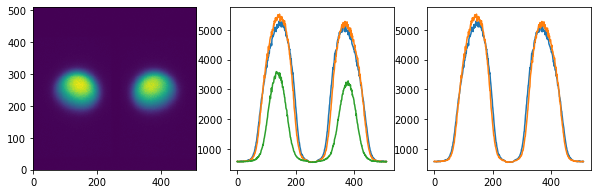

In [248]:
%matplotlib inline
plt.figure(figsize=[10,3])
plt.subplot(131)
plt.imshow(flc0[0,:,:],origin='lower')
plt.subplot(132)
plt.plot(flc0[0,250,:])
plt.plot(flc0[0,270,:])
plt.plot(flc0[0,300,:])
plt.subplot(133)
plt.plot(flc0[0,250,:])
plt.plot(flc0[0,270,:])

### The above plots show some "wavy" patterns in both the raw disc shapes

### Doing the same for some arbitrary frames... 

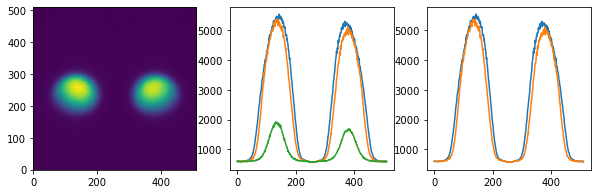

In [249]:
%matplotlib inline
plt.figure(figsize=[10,3])
plt.subplot(131)
plt.imshow(flc0[500,:,:],origin='lower')
plt.subplot(132)
plt.plot(flc0[500,250,:])
plt.plot(flc0[500,270,:])
plt.plot(flc0[500,300,:])
plt.subplot(133)
plt.plot(flc0[500,250,:])
plt.plot(flc0[500,270,:])

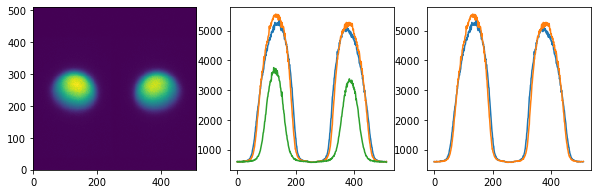

In [250]:
%matplotlib inline
plt.figure(figsize=[10,3])
plt.subplot(131)
plt.imshow(flc0[1000,:,:],origin='lower')
plt.subplot(132)
plt.plot(flc0[1000,250,:])
plt.plot(flc0[1000,270,:])
plt.plot(flc0[1000,300,:])
plt.subplot(133)
plt.plot(flc0[1000,250,:])
plt.plot(flc0[1000,270,:])

### Histogram analysis.  

### All frames 

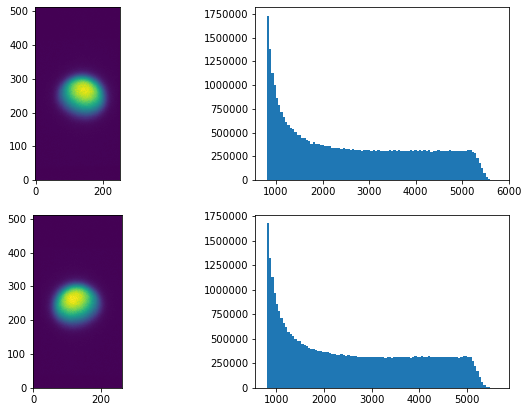

In [251]:
# take only one half of each image and plot the values higher than a certain threshold. 
%matplotlib inline
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.imshow(flc0[0,:,0:250],origin='lower')
hdata = flc0[:,:,0:250]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
hdata = hdata[hdata<=20000]
plt.subplot(222)
_ = plt.hist(hdata,bins=100)
plt.subplot(223)
plt.imshow(flc0[0,:,250:],origin='lower')
hdata = flc0[:,:,250:]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
hdata = hdata[hdata<=20000]
plt.subplot(224)
_ = plt.hist(hdata,bins=100)

### Frame no. 100

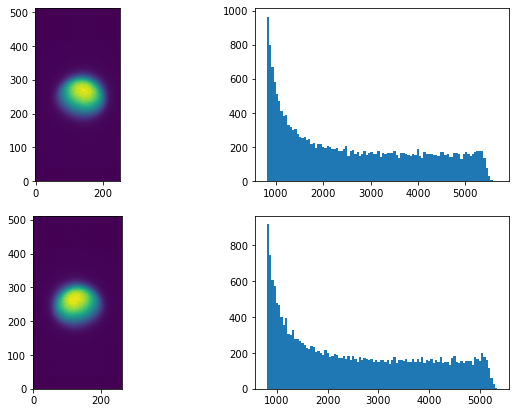

In [252]:
# take only one half of each image and plot the values higher than a certain threshold. 
%matplotlib inline
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.imshow(flc0[100,:,0:250],origin='lower')
hdata = flc0[100,:,0:250]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(222)
_ = plt.hist(hdata,bins=100)
plt.subplot(223)
plt.imshow(flc0[100,:,250:],origin='lower')
hdata = flc0[100,:,250:]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(224)
_ = plt.hist(hdata,bins=100)

### first remove the dark noise from the frames by subtracting 2 consecutive frames from one dark noise frame

In [253]:
# dark data
#plt.imshow(dark[0,:,:],origin='lower')
# make a loop over the dark image
flc0_dr = np.zeros(flc0.shape)    # flc0 dark removed array
j = 0
for i in range(len(dark)):
    #print(i,j)
    flc0_dr[j,:,:] = flc0[j,:,:] - dark[i,:,:]
    flc0_dr[j+1,:,:] = flc0[j+1,:,:] - dark[i,:,:]
    j+=2

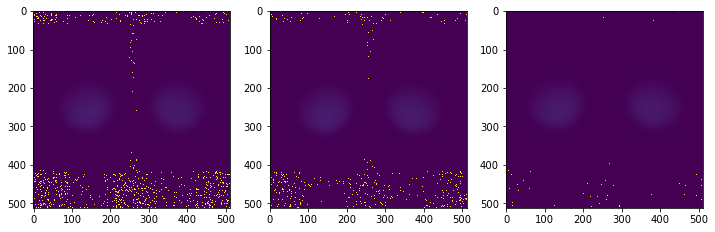

In [254]:
%matplotlib inline
plt.figure(figsize=[12,6])
plt.subplot(131)
plt.imshow(flc0_dr[2,:,:])#plt.colorbar()
plt.subplot(132)
plt.imshow(flc0_dr[20,:,:])#;plt.colorbar()
plt.subplot(133)
plt.imshow(flc0_dr[200,:,:])#;plt.colorbar()

### Remove the high values 

In [255]:
flc0_dr[flc0_dr > 50000] = np.nan    # we set them to NaN!!! i.e. they are not displayed.

### Show the resulting array

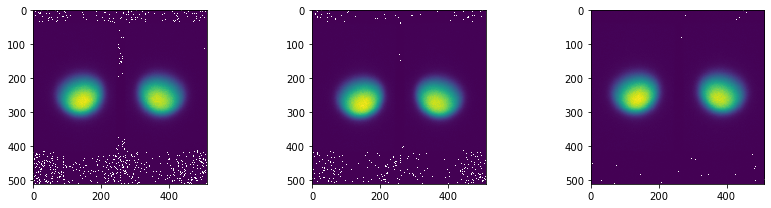

In [256]:
plt.figure(figsize=[12,3])
plt.subplot(131)
plt.imshow(flc0_dr[2,:,:])#;plt.colorbar()
plt.subplot(132)
plt.imshow(flc0_dr[20,:,:])#;plt.colorbar()
plt.subplot(133)
plt.imshow(flc0_dr[200,:,:])#;plt.colorbar()
plt.tight_layout()

### 10 bins histogram  

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater_equal
  
/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater_equal
  from ipykernel import kernelapp as app


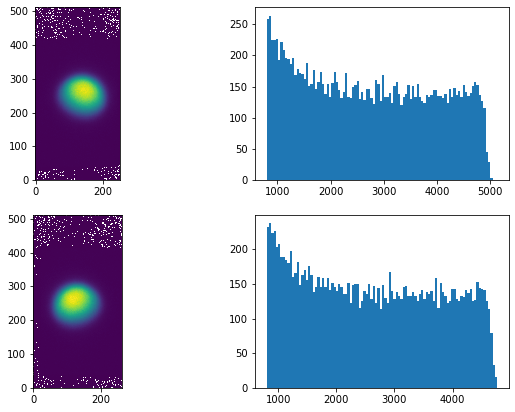

In [257]:
# take only one half of each image and plot the values higher than a certain threshold. 
%matplotlib inline
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.imshow(flc0_dr[0,:,0:250],origin='lower')
hdata = flc0_dr[0,:,0:250]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(222)
_ = plt.hist(hdata,bins=100)
plt.subplot(223)
plt.imshow(flc0_dr[0,:,250:],origin='lower')
hdata = flc0_dr[0,:,250:]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(224)
_ = plt.hist(hdata,bins=100)

### Add 100 odd frames into one 

In [258]:
data = np.zeros(flc0_dr[0,:,:].shape)
for i in range(0,202,2):
    #print(i)
    data = data+flc0_dr[i,:,:]
data = data/100

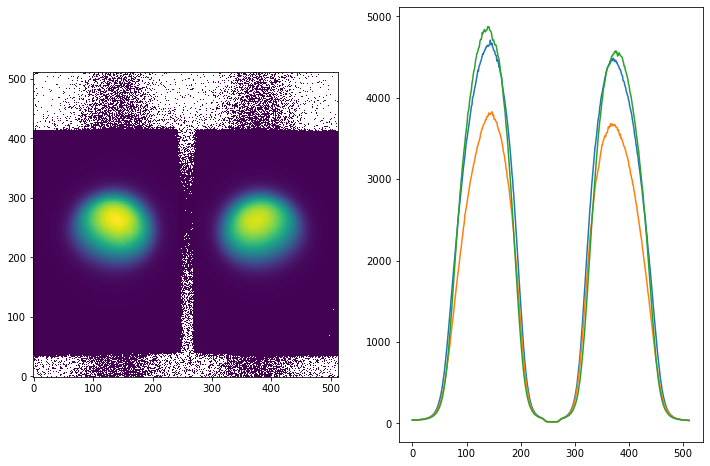

In [259]:
plt.figure(figsize=[12,8])
plt.subplot(121)
plt.imshow(data,origin='lower')
plt.subplot(122)
plt.plot(data[250,:])
plt.plot(data[230,:])
plt.plot(data[270,:])

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater_equal
  
/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater_equal
  from ipykernel import kernelapp as app


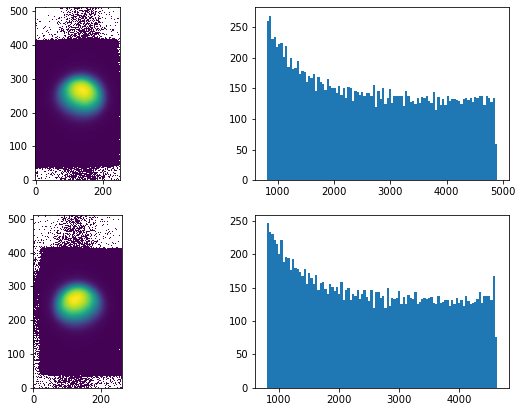

In [260]:
# take only one half of each image and plot the values higher than a certain threshold. 
%matplotlib inline
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.imshow(data[:,0:250],origin='lower')
hdata = data[:,0:250]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(222)
_ = plt.hist(hdata,bins=100)
plt.subplot(223)
plt.imshow(data[:,250:],origin='lower')
hdata = data[:,250:]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(224)
_ = plt.hist(hdata,bins=100)

### Add 500 even frames into one 

In [261]:
data500 = np.zeros(flc0_dr[0,:,:].shape)
for i in range(0,1002,2):
    #print(i)
    data500 = data500+flc0_dr[i,:,:]
data500 = data500/500

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater_equal
  
/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater_equal
  from ipykernel import kernelapp as app


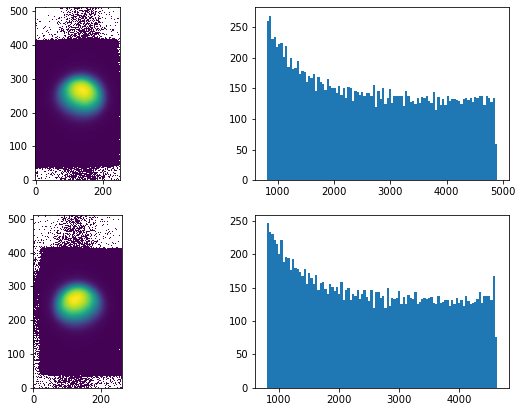

In [262]:
# take only one half of each image and plot the values higher than a certain threshold. 
%matplotlib inline
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.imshow(data[:,0:250],origin='lower')
hdata = data[:,0:250]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(222)
_ = plt.hist(hdata,bins=100)
plt.subplot(223)
plt.imshow(data[:,250:],origin='lower')
hdata = data[:,250:]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(224)
_ = plt.hist(hdata,bins=100)

### Add 500 odd frames into one 

In [263]:
data500o = np.zeros(flc0_dr[0,:,:].shape)
for i in range(1,1003,2):
    #print(i)
    data500o = data500o+flc0_dr[i,:,:]
data500o = data500o/500

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater_equal
  
/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in greater_equal
  from ipykernel import kernelapp as app


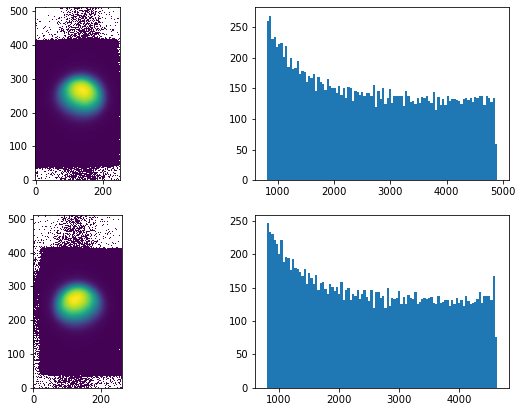

In [264]:
# take only one half of each image and plot the values higher than a certain threshold. 
%matplotlib inline
plt.figure(figsize=[10,7])
plt.subplot(221)
plt.imshow(data[:,0:250],origin='lower')
hdata = data[:,0:250]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(222)
_ = plt.hist(hdata,bins=100)
plt.subplot(223)
plt.imshow(data[:,250:],origin='lower')
hdata = data[:,250:]
hdata = hdata.flatten()
hdata = hdata[hdata>=800]
plt.subplot(224)
_ = plt.hist(hdata,bins=100)

### What happens if we calculate P without planet alignment?

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in true_divide


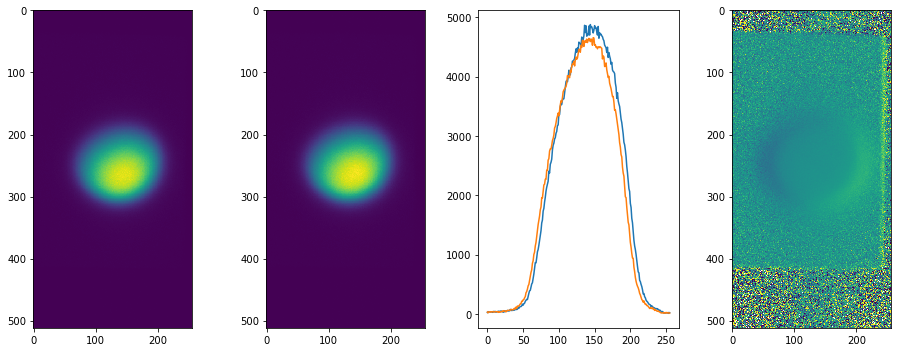

In [369]:
fn = 0  # frame number 
img = flc0_dr[fn,:,:]

def splitnflip(img):
    left = np.nan_to_num(img[:,:int(512/2)])
    right = np.nan_to_num(img[:,int(512/2):])
    # flip right image 
    rightm = np.zeros(right.shape)
    for i in range(len(right[0,:])):
        rightm[:,i] = right[:,-1-i]
    return left,right,rightm

left,right,rightm = splitnflip(img)

# get the points of maximum intensity
lbi = np.where(left==left.max())
rbi = np.where(rightm==rightm.max())

%matplotlib inline
# plot
plt.figure(figsize=[13,5])
plt.subplot(141)
plt.imshow(left)
#plt.scatter(lbi[1],lbi[0])
plt.subplot(142)
plt.imshow(rightm)
#plt.scatter(rbi[1],rbi[0])
plt.subplot(143)
plt.plot(left[255,:])
plt.plot(rightm[255,:])
# plot the raw polarization
plt.subplot(144)
plt.imshow((left-rightm)/(left+rightm))
plt.tight_layout()

### Make a function to perform simple linear shifts in both axes

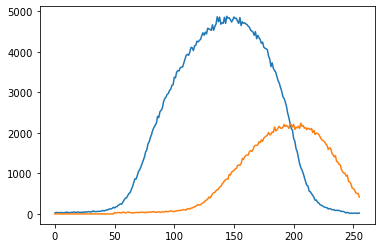

In [313]:
def shift_img(imgin,xstep,ystep):
    imgout = np.zeros(imgin.shape)
    imgout_temp = np.zeros(imgin.shape)
    # for the step in x
    for i in range(len(imgin[0,:])):
        if (i+xstep)<len(imgin[0,:]):
            imgout_temp[:,i+xstep] = imgin[:,i]
    # for the step in y (here imgout_temp is modified!)
    for i in range(len(imgout_temp[:,0])):
        if (i+ystep)<len(imgout_temp[:,0]):
            imgout[i+ystep,:] = imgout_temp[i,:]
    return imgout

# check the function
imgout = shift_img(left,50,50)
plt.plot(left[255,:])
plt.plot(imgout[255,:])

### Make a function to take a list of possible shifts and find the best fit 

In [383]:
xshift = np.arange(-50,50)
yshift = np.arange(-50,50)

source = rightm  # image to be shifted
target = left   # image on which the best fit should be found

def transform(source,target,xshift,yshift):
    # set the lower values to zero to align only the brightest parts
    #source[source<4000] = 0
    #target[target<4000] = 0
    res_arr = np.zeros((len(xshift),len(yshift)))
    for i in range(len(xshift)):
        for j in range(len(yshift)):
            shifted = shift_img(source,xshift[i],yshift[j])
            residual = np.average(np.abs(shifted - target).flatten())
            res_arr[i,j] = residual
    idx = np.where(res_arr == res_arr.min())
    print("The best fit found at x = ",idx[1]," y = ",idx[0])
    finalimg = shift_img(source,xshift[idx[1][0]],yshift[idx[0][0]])
    return finalimg,res_arr

bestfitimg,res_arr = transform(rightm,left,xshift,yshift)

The best fit found at x =  [51]  y =  [54]


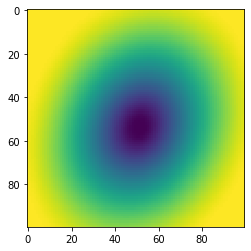

In [379]:
plt.imshow(res_arr)

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


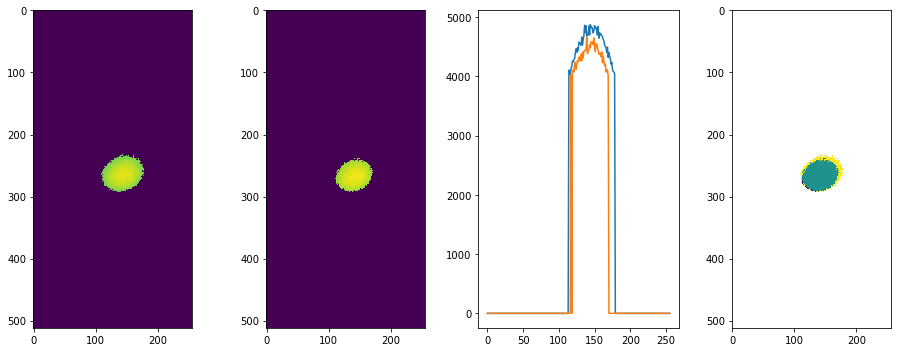

In [382]:
%matplotlib inline
# plot
plt.figure(figsize=[13,5])
plt.subplot(141)
plt.imshow(left)
#plt.scatter(lbi[1],lbi[0])
plt.subplot(142)
plt.imshow(bestfitimg)
#plt.scatter(rbi[1],rbi[0])
plt.subplot(143)
plt.plot(left[255,:])
plt.plot(bestfitimg[255,:])
# plot the raw polarization
plt.subplot(144)
plt.imshow((left-bestfitimg)/(left+bestfitimg))
plt.tight_layout()

### Now combine two frames to produce a P image 

In [384]:
# take two consecutive frames
AL,_,AR = splitnflip(flc0_dr[0,:,:])
BL,_,BR = splitnflip(flc0_dr[1,:,:])

xshift = np.arange(-20,20)
yshift = np.arange(-20,20)
# now perform alignment for AL and BR and add them
BR,res_arr = transform(BR,AL,xshift,yshift)
# alignment of AR and BL and add them
AR,res_arr = transform(BL,AR,xshift,yshift)

The best fit found at x =  [20]  y =  [24]
The best fit found at x =  [18]  y =  [15]


/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


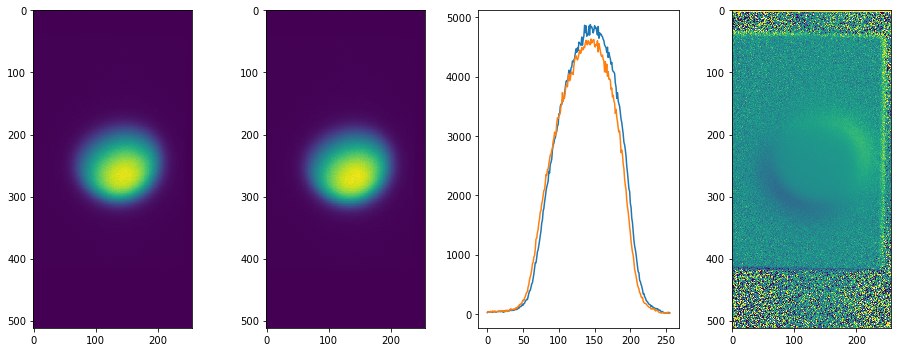

In [385]:
%matplotlib inline
# plot
plt.figure(figsize=[13,5])
plt.subplot(141)
plt.imshow(AL)
#plt.scatter(lbi[1],lbi[0])
plt.subplot(142)
plt.imshow(BR)
#plt.scatter(rbi[1],rbi[0])
plt.subplot(143)
plt.plot(AL[255,:])
plt.plot(BR[255,:])
# plot the raw polarization
plt.subplot(144)
plt.imshow((AL-BR)/(AL+BR))
plt.tight_layout()

/Users/gouravmahapatr/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


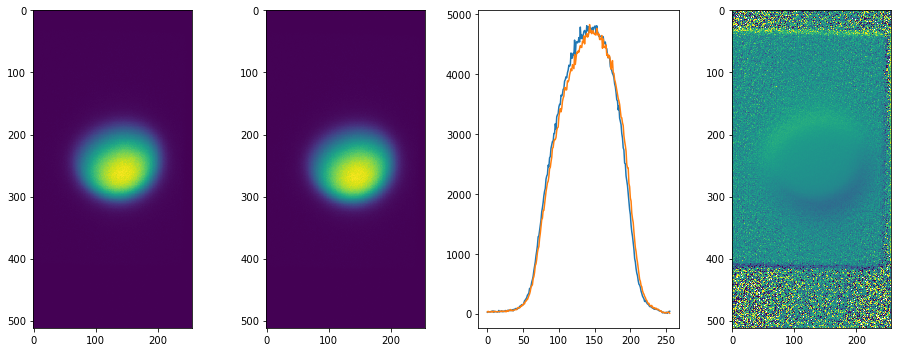

In [386]:
%matplotlib inline
# plot
plt.figure(figsize=[13,5])
plt.subplot(141)
plt.imshow(AR)
#plt.scatter(lbi[1],lbi[0])
plt.subplot(142)
plt.imshow(BL)
#plt.scatter(rbi[1],rbi[0])
plt.subplot(143)
plt.plot(AR[255,:])
plt.plot(BL[255,:])
# plot the raw polarization
plt.subplot(144)
plt.imshow((AR-BL)/(AR+BL))
plt.tight_layout()